# Stock Analysis

In [1]:
stock_ticker = "BOMDYEING"             #Change ticker name here and re-run the notebook
ema          = (30,60,200)          #Set periods for Exponentail Moving Average
focus_period = 1000                 #Filter period for focus. If set only last 150 trading days data will be shown for analysis.

**Installing Package**

In [3]:
from portfoliotools.screener.stock_detail import StockDetail
from portfoliotools.screener.stock_fundamentals import StockFundamentals
#from portfoliotools.screener.screener_pattern import CandleStickPatters
from portfoliotools.screener.utility.util import NumToStr, flatten_dicts_of_dicts, backTestStrategy, slope, get_arima_predictions
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from IPython.display import display_html
from pandas.plotting import register_matplotlib_converters
from plotly.subplots import make_subplots
import nsetools

import warnings
warnings.filterwarnings("ignore")
register_matplotlib_converters()
%matplotlib inline
sns.set()
pd.options.display.max_columns = None
pd.options.display.max_rows = None

nse = nsetools.Nse()
if not nse.is_valid_code(stock_ticker) and "NIFTY" not in stock_ticker:
    raise(Exception("Not a Valid Ticker"))
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

In [4]:
stockObj = StockDetail(stock_ticker, period = 2000)
stock_funda = StockFundamentals(stock_ticker)
details = stockObj.details()
details_funda = stock_funda.get_details_info()

ERROR:root:Error calculating ATR Results - BOMDYEING
ERROR:root:Error fetching Summary statistics info - BOMDYEING
ERROR:root:Error fetching Summary statistics info - BOMDYEING


### <font color = "red">Overview</font>

In [5]:
info = details['Overview']['Info']
info['Beta'] = details_funda.get('Beta (5Y monthly)')
df1 = pd.DataFrame(data = np.array(list(info.values())), index = np.array(list(info.keys())), columns = ['Overview'])
info = details['Overview']['52W Statistics']
df2 = pd.DataFrame(data = np.array(list(info.values())), index = np.array(list(info.keys())), columns = ['52W Stats'])
info = details['Overview']['Returns']
df3 = pd.DataFrame(data = np.array(list(info.values())), index = np.array(list(info.keys())), columns = ['Return Stats'])
info = details['Fundamental Analytics']
info['Trailing P/E'] = details_funda.get('Trailing P/E')
info['Forward P/E']  = details_funda.get('Forward P/E')
info['P/B']          = details_funda.get('Price/book')
info['PEG Ratio']    = details_funda.get('PEG Ratio (5 yr expected)')
info['Debt/Equity']  = details_funda.get('Total debt/equity')
info['ROA']          = details_funda.get('Return on assets')
info['ROE']          = details_funda.get('Return on equity')
df4 = pd.DataFrame(data = np.array(list(info.values())), index = np.array(list(info.keys())), columns = ['Fundamentals'])
info = flatten_dicts_of_dicts(details['Technical Analytics'])
df5 = pd.DataFrame( data = info.values(), index = np.array(list(info.keys())), columns = ['Technical Signals'])
cols = [col for col in df5.index.tolist() if 'Signal' in col]
df5 = df5.loc[cols,:]
display_side_by_side(df1,df2,df3,df4,df5)

,Overview
Stock Name,BOMDYEING
Date,03Apr20
Last Close,46.6
Last COB,03Apr20
Average Volume,2111883.71
Standard Deviation,7.5
CAGR,-5.57
Annual Volatility,53.84
Sharpe,-0.168
Sortino,-0.273


## <font color = 'red'>Fundamental Analysis</font>

### - Details 
    Balance sheet
    Cash Flow
    Key Statistics
    Income Statement

In [6]:
info = stock_funda.get_balance_sheet_info()
df1 = pd.DataFrame( data = NumToStr(info.values()), index = np.array(list(info.keys())), columns = ['Balance Sheet'])
info = stock_funda.get_financial_info()
df2 = pd.DataFrame( data = NumToStr(info.values()), index = np.array(list(info.keys())), columns = ['Financial Info'])
info = stock_funda.get_cash_flow_info()
df3 = pd.DataFrame( data = NumToStr(info.values()), index = np.array(list(info.keys())), columns = ['Cash Flow Info'])
info = stock_funda.get_key_statistics()
df4 = pd.DataFrame( data = NumToStr(info.values()), index = np.array(list(info.keys())), columns = ['Key Statistics'])
info = stock_funda.get_summary_statistics()
df5 = pd.DataFrame( data = NumToStr(info.values()), index = np.array(list(info.keys())), columns = ['Summary Statistics'])
display_side_by_side(df1, df3, df4, df2, df5)

ERROR:root:Error fetching Summary statistics info - BOMDYEING


,Balance Sheet
Assets,nan
Current assets,nan
Cash,nan
Cash and cash equivalents,"288,100.0"
Other Short Term Investments,"7,100.0"
Total cash,"295,200.0"
Net receivables,"10,922,200.0"
Inventory,"22,005,200.0"
Other current assets,"61,600.0"
CurrAsset,"34,748,300.0"


## <font color = "red">Technical Analysis</font>

In [7]:
data = stockObj.generate_moving_averages(exponential=ema)
data = data.tail(focus_period) # last 150 periods

### - Close Price vs Volumne

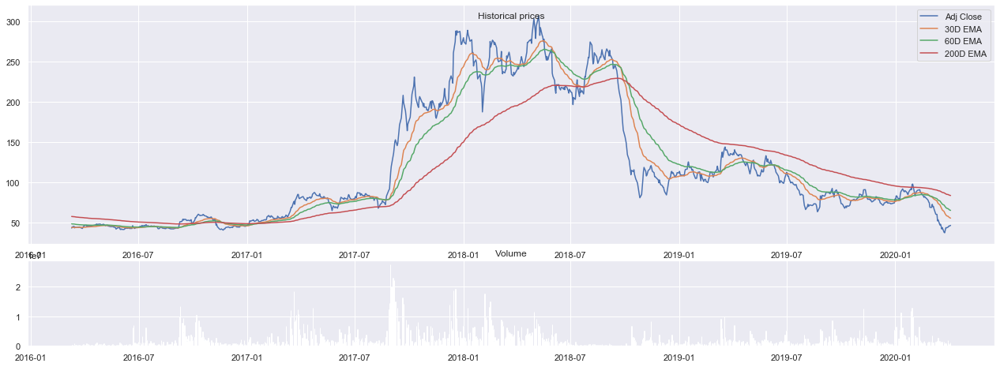

In [8]:
# Adjusted Close & Volumne - Historical
fig = plt.figure(figsize = (17,6))
fig.suptitle("Historical prices")

ax1 = fig.add_axes([0,.3,1,.7])
ax1.plot(data.index, data['Adj Close'], label = 'Adj Close')
ax1.legend()
for period in ema:
    col = '{0}D Exponential Moving Average'.format(period)
    label = '{0}D EMA'.format(period)
    ax1.plot( data.index, data[col], label = label)
    ax1.legend()

ax2 = fig.add_axes([0,0,1,.25])
ax2.set_title("Volume")
vol = data['Volume']#np.log10(data['Volume'])
#vol_cmap = data['Volume'].apply(lambda x, vol: 'rgb(250,0,0)' if x<vol else 'rgb(0,250,0)',vol = vol.mean())
ax2.bar(data.index, vol)
#ax2.set_ylim([vol.min()-.5, vol.max() + .5])
#ax2.plot(data.index, [vol.mean()]*len(vol), color = vol_cmap.tolist())
plt.show()

### Bollinger Bands

In [9]:
data = stockObj.get_bollinger_details().tail(focus_period)

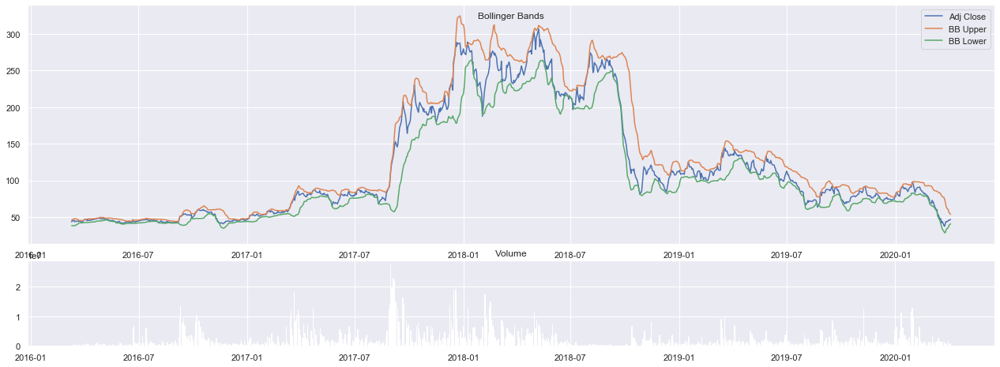

In [10]:
fig = plt.figure(figsize = (17,6))
fig.suptitle("Bollinger Bands")

ax1 = fig.add_axes([0,.3,1,.7])
ax1.plot(data.index, data['Adj Close'], label = 'Adj Close')
ax1.legend()
for part in ['Upper', 'Lower']:
    col = 'Bollinger Band {0}'.format(part)
    label = 'BB {0}'.format(part)
    ax1.plot( data.index, data[col], label = label)
    ax1.legend()

ax2 = fig.add_axes([0,0,1,.25])
ax2.set_title("Volume")
vol = data['Volume']
ax2.bar(data.index, vol)
plt.show()

### - Close Price Candle Stick

In [11]:
## Candle Stick - Historical
fig = go.Figure(data=[go.Candlestick(x=data.index,
                       open=data['Open'], high=data['High'],
                       low=data['Low'], close=data['Close'])])
#fig.layout.xaxis.type = 'category'
fig.show()

### - Williams R
**Description:** %D is 5 day smooth average of %R. Buy signal is triggered when %D is less than -75 and volume is more than 1.25 times avg 5 day volume. Sell signal is triggered when %D is more than -20 and volume is more than 1.25 times avg 5 day volume.

**Backtest Strategy**: Passive - Portfolio starts with 100% cash and there is no repump of cash into portfolio i.e. if there is a buy signal when no cash is in the portfolio, Buy order is not executed.
Active - Portfolio starts with 100% cash and at each Buy signal, initial cash is re-pumped into portfolio if there is not enough cash left for investment.

In [12]:
#data = stockObj.get_williams_r_details()[2] # To get williams R data frame
fig = stockObj.plot_williams_r_details(period = focus_period)
fig.show()

### - MACD
**Descrption**: MACD is momentum indicator. MACD Line is EMA(12D) - EMA(26D). MACD Indicator is exponential moving average of MACD.
When MACD Line crosses MACD Indicator from top, it's a BUY zone. When MACD Line crosses MACD Indicator from below, it's a SELL zone. BUY signal is generated when BUY Zone creates a maxima based on 9 day period. SELL signal is generated when SELL Zone creates a maxima.

**Backtest Strategy**: Passive - Portfolio starts with 100% cash and there is no repump of cash into portfolio i.e. if there is a buy signal when no cash is in the portfolio, Buy order is not executed.
Active - Portfolio starts with 100% cash and at each Buy signal, initial cash is re-pumped into portfolio if there is not enough cash left for investment.

In [13]:
fig = stockObj.plot_macd_details(period = focus_period)
fig.show()

### - RSI
**Descrption**: Relative Stregth Index(RSI) is momentum indicator. Relative Strength is calculated as ration of Average Gains to Average Loss. RS is then indexed to calculate RSI.

**Formula:** RS = Avg Gain/Avg Loss; 
RSI = 100 - 100/(1+RS)

Buy signal is given when RSI < 30.
Sell signal is given when RSI > 70.

**Backtest Strategy**: Passive - Portfolio starts with 100% cash and there is no repump of cash into portfolio i.e. if there is a buy signal when no cash is in the portfolio, Buy order is not executed.
Active - Portfolio starts with 100% cash and at each Buy signal, initial cash is re-pumped into portfolio if there is not enough cash left for investment.

In [14]:
fig = stockObj.plot_rsi_details(period = focus_period)
fig.show()

### - OBV
**Description:** OBV is a momentum indicator. BUY signal is triggered when OBV Index is less than 0 and rate of OBV Index change is more than 60. SELL signal is triggered when OBV Index is more than 0 and rate of OBV Index change is more than 60.

**Backtest Strategy**: Passive - Portfolio starts with 100% cash and there is no repump of cash into portfolio i.e. if there is a buy signal when no cash is in the portfolio, Buy order is not executed.
Active - Portfolio starts with 100% cash and at each Buy signal, initial cash is re-pumped into portfolio if there is not enough cash left for investment.

In [15]:
fig = stockObj.plot_obv_details(period = focus_period)
fig.show()

### ADX/ATR
**Description:**

**ADX Value  	        Trend Strength**

0-25	                Absent or Weak Trend

25-50	                Strong Trend

50-75	                Very Strong Trend

75-100	                Extremely Strong Trend


In [16]:
data = stockObj.get_adx_details()
data = data.join(stockObj.get_atr_details()['ATR'])
data.dropna(inplace = True)
data = data.tail(focus_period)

In [17]:
fig = make_subplots(rows = 3, cols = 1, shared_xaxes= True, vertical_spacing = 0.08, 
    column_widths = [15], row_heights = [2,2,2],
    specs=[[{"secondary_y": True}], [{"secondary_y": False}], [{"secondary_y": False}]])

hovertext      = ["<br>Close : " + "{:,}".format(np.round(txt['Close'],2)) + 
                    "<br>High: " + "{:,}".format(np.round(txt['High'],2)) + 
                    "<br>Low: " + "{:,}".format(np.round(txt['Low'],2)) + 
                    "<br>Volume: " + "{:,}".format(txt['Volume']) + 
                    "<br>ATR: " + "{:,}".format(np.round(txt['ATR'],2)) +
                    "<br>ADX: " + "{:,}".format(np.round(txt['ADX'],2))
                    for txt in data.to_dict(orient = "records")]
# Add Close Price
fig.add_trace(
go.Scatter(x=data.index, y=data['Close'], name="Close", text = hovertext, line = {'color':'purple'}), row = 2, col =1,
)
# Add ADX
fig.add_trace(
go.Scatter(x=data.index, y=data['ADX'], name="ADX", text = hovertext, line = {'color':'darkgray'}), row = 1, col =1,
)
# Add ATR
fig.add_trace(
go.Scatter(x=data.index, y=data['ATR'], name="ATR", text = hovertext, line = {'color':'black'}), row = 1, col =1,
secondary_y = True)                                                       
# Add Volume
fig.add_trace(
go.Scatter(x=data.index, y=data['Volume'], name="Volume", text = hovertext, line = {'color':'black'}), row = 3, col =1,
)
fig['layout']['yaxis1'].update(title='ADX')
fig['layout']['yaxis2'].update(title='ATR')
fig['layout']['yaxis3'].update(title='Close')
fig['layout']['yaxis4'].update(title='Volume')
fig.show()

### Combined Analysis

In [18]:
combined_analysis = stockObj.technical_details
combined_analysis.dropna()

Prices                                                  \
                  High         Low        Open       Close      Volume   
Date                                                                     
2014-11-25   68.866049   64.829074   67.916172   65.541481   2323532.0   
2014-11-26   67.061281   64.781576   64.781576   66.396370    807385.0   
2014-11-27   66.396364   65.019039   66.111398   65.446487    574290.0   
2014-11-28   67.346247   65.493984   65.778950   65.731453    807177.0   
2014-12-01   66.206389   64.259147   65.398996   64.544106    449709.0   
2014-12-02   67.061276   63.926688   64.116661   66.443855   1499201.0   
2014-12-03   68.533590   66.396368   66.443858   67.441231   1817257.0   
2014-12-04   72.428080   66.966290   67.013787   71.098251   5511551.0   
2014-12-05   72.665552   69.056019   71.478207   69.388481   2533505.0   
2014-12-08   70.480842   65.778956   69.246007   66.586349   1690401.0   
2014-12-09   68.106156   65.541491   66.063926   66.158913    947031.0   
2014-12-10   68.011156   66.111403   66.253886   66.871307    953285.0   
2014-12-11   66.871306   65.161525   66.586340   65.588974    663999.0   
2014-12-12   70.053392   65.636465   65.873934   66.871307   3333783.0   
2015-01-02   65.161523   63.546736   63.546736   64.401627    743944.0   
2015-01-05   64.971556   63.261776   64.401632   63.499245    493122.0   
2015-01-06   63.071804   60.792099   62.929321   61.077065    683376.0   
2015-01-07   61.552004   59.604754   60.934582   60.554630    622529.0   
2015-01-08   62.501878   60.934580   61.267036   61.694477    704082.0   
2015-01-09   62.454382   60.649615   62.121927   61.172050    463410.0   
2015-01-12   63.926695   61.124554   61.409520   62.929321   1016570.0   
2015-01-13   63.499240   61.457004   63.071798   62.026936    616462.0   
2015-01-14   62.311903   60.887088   61.884461   61.219543    359516.0   
2015-01-15   62.549363   61.409514   61.836956   61.931942    665824.0   
2015-01-16   63.641730   61.267038   61.979446   62.501881    786213.0   
2015-01-19   63.974184   62.264410   62.264410   63.119293    559833.0   
2015-01-20   68.771062   63.119292   63.119292   68.058655   4261810.0   
2015-01-21   77.557421   67.726200   68.818552   76.322578  10098315.0   
2015-01-22   77.367440   73.520444   76.085108   75.040245   4645478.0   
2015-01-23   76.370080   71.335731   75.182734   73.852905   2814934.0   
2015-01-27   74.517820   70.528341   73.330474   71.668190   1293385.0   
2015-01-28   79.694646   70.480839   71.193247   74.517815   6052965.0   
2015-01-29   80.217061   73.330457   74.090361   79.504654   5981685.0   
2015-01-30   81.689377   76.465056   80.169576   77.034981   3106203.0   
2015-02-02   83.019215   77.889880   77.889880   80.834496   3880425.0   
2015-02-03   81.024475   78.032362   81.024475   78.887253   1430100.0   
2015-02-04   81.214449   77.224970   79.314695   78.222336   2762598.0   
2015-02-05   77.224969   71.193247   76.940003   72.190620   1793235.0   
2015-02-06   72.000648   69.151018   71.478213   70.053398   1215869.0   
2015-02-09   72.950520   67.821186   68.961034   70.290863   1074393.0   
2015-02-10   72.903026   68.723567   69.151016   71.288239    955568.0   
2015-02-11   74.897768   71.478214   71.525711   73.757919   1173325.0   
2015-02-12   78.602292   72.618067   73.757923   77.889885   2452241.0   
2015-02-13   78.744764   74.327837   78.222329   75.420197   1302729.0   
2015-02-16   77.414941   74.232856   75.895140   74.612808    929428.0   
2015-02-18   83.446659   76.560054   76.560054   77.082489   2335827.0   
2015-02-19   77.652412   74.660299   77.509929   75.895142    908220.0   
2015-02-20   77.794891   74.565309   76.275090   75.847641    973117.0   
2015-02-23   76.465054   73.282969   76.132599   73.995377    769275.0   
2015-02-24   74.375332   71.335723   73.995380   71.905647    644737.0   
2015-02-25   72.903016   69.815917   72.285595   70.195869    807490.0   
2015-02-26   70.9082

## <font color = "red">Predictions </font>

### ARIMA

,MSE,SMAPE KUN,Pred Value,Pred Low 5%,Pred High 5%
0,12.271,29.095,[46.71],38.21,55.22


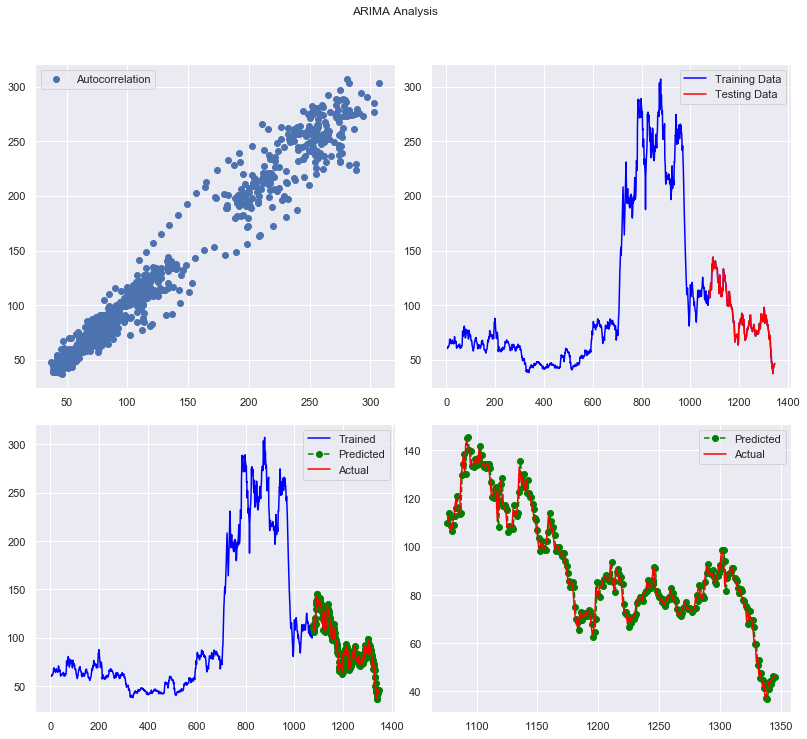

In [19]:
data = stockObj.historical_prices['Close'].values
result = get_arima_predictions(data, plot = True)
pd.DataFrame([result[0]])